# Raw data

In [2]:
import pandas as pd
import yaml

raw_data = pd.read_csv("../data/raw/Ramsey_base_config_0_raw.csv")
raw_data.head()

FileNotFoundError: [Errno 2] No such file or directory: '../data/raw/Ramsey_base_config_0_raw.csv'

# Processed data

In [3]:
parquet = pd.read_parquet("../data/processed/Ramsey_base_config_0.parquet").head()
parquet

FileNotFoundError: [Errno 2] No such file or directory: '../data/processed/Ramsey_base_config_0.parquet'

In [4]:
parquet['info'][0]

NameError: name 'parquet' is not defined

# Dynamics from processed data (a.k.a RL transitions)

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def variables_dynamics_plots(raw_data: pd.DataFrame, steady_state: dict[str, float]):
    columns = raw_data.columns

    fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(8, 4 * len(columns)), dpi=100)

    for idx, column in enumerate(columns):
        column_values = raw_data[column].to_numpy()
        steps = np.arange(len(column_values))

        ax = axes[idx]

        ax.plot(steps, column_values, marker='o', color='blue',
                label=f"Dynamics of {column}", linewidth=2)

        if column in steady_state:
            ss_values = steady_state[column]
            ax.plot(steps, ss_values, color='red', linestyle='--', linewidth=2.5,
                    label=f"Steady State {column}")
        
        ax.legend(fontsize=10)
        ax.set_xlabel("Step", fontsize=14)
        ax.set_ylabel(f"{column}", fontsize=14)
        ax.set_title(f"{column}: Transition to Steady State", fontsize=16)
        ax.set_xticks(steps[::4])
        
        ax.yaxis.set_major_locator(plt.MaxNLocator(10))
        
        ax.set_xticklabels(ax.get_xticks(), rotation=90)
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

## Ramsey base model

In [6]:
raw_data = pd.read_csv("../data/raw/Ramsey_base_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Investment
0,0.828782,0.771800,0.852992,0.024209
1,18.671115,181.654552,24.369129,5.698014
2,18.671115,181.654552,24.369129,5.698014
3,18.671115,181.654552,24.369129,5.698014
4,18.671115,181.654552,24.369129,5.698014


In [7]:
with open("../data/raw/Ramsey_base_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)
params

{'alpha': 0.613851,
 'beta': 0.951492,
 'delta': 0.031367,
 'k_ss': 181.654552,
 'c_ss': 18.671115,
 'y_ss': 24.369129,
 'i_ss': 5.698014,
 'start_capital': 0.7718}

In [8]:
import matplotlib.pyplot as plt
import numpy as np

alpha = params['alpha']
beta = params['beta']
delta = params['delta']

k_ss = ((1 / beta - (1 - delta)) / alpha) ** (1 / (alpha - 1))
y_ss = k_ss ** alpha
i_ss = delta * k_ss
c_ss = y_ss - i_ss

steps = np.arange(raw_data.shape[0])

k_ss = k_ss * np.ones(raw_data.shape[0])
y_ss = y_ss * np.ones(raw_data.shape[0])
i_ss = i_ss * np.ones(raw_data.shape[0])
c_ss = c_ss * np.ones(raw_data.shape[0])

steady_state = {
    "Capital": k_ss,
    "Output": y_ss,
    "Investment": i_ss,
    "Consumption": c_ss
}

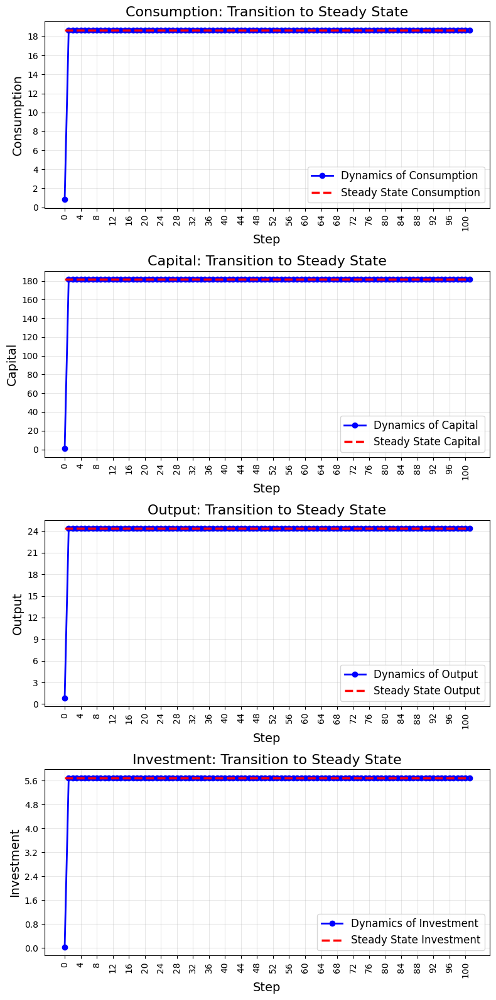

In [9]:
variables_dynamics_plots(raw_data, steady_state)

## Ramsey CRRA

In [10]:
raw_data = pd.read_csv("../data/raw/Ramsey_crra_config_0_raw.csv")
raw_data.head()

,ConsumptionPerCapita,CapitalPerCapita,OutputPerCapita,InvestmentPerCapita,Labor,Consumption,Capital,Output
0,0.939531,1.041463,1.021164,0.081634,1.000000,0.939531,1.041463,1.021164
1,0.649481,1.331513,1.021164,0.371683,1.006258,0.653546,1.339845,1.027555
2,0.733877,1.652315,1.159048,0.425171,1.012555,0.743091,1.673060,1.173600
3,0.817515,2.000762,1.295476,0.477962,1.018892,0.832959,2.038560,1.319950
4,0.900013,2.373704,1.429782,0.529769,1.025268,0.922755,2.433683,1.465910


In [11]:
raw_data.tail()

,ConsumptionPerCapita,CapitalPerCapita,OutputPerCapita,InvestmentPerCapita,Labor,Consumption,Capital,Output
97,3.246610,22.456127,4.976837,1.730227,1.831505,5.946183,41.128516,9.115103
98,3.251781,22.417274,4.973125,1.721345,1.842967,5.992924,41.314294,9.165306
99,3.257089,22.371720,4.968688,1.711599,1.854500,6.040273,41.488361,9.214433
100,3.262559,22.319059,4.963480,1.700921,1.866106,6.088281,41.649726,9.262380
101,3.268216,24.090041,5.156487,1.888270,1.866106,6.098838,44.954566,9.622550


In [12]:
with open("../data/raw/Ramsey_crra_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)
params

{'alpha': 0.515512,
 'beta': 0.969028,
 'delta': 0.072616,
 'sigma': 2.32148,
 'n': 0.006258,
 'k_ss': 24.090041,
 'c_ss': 3.268216,
 'y_ss': 5.156487,
 'i_ss': 1.88827,
 'start_capital': 1.041463,
 'start_labor': 1.0}

In [13]:
alpha = params['alpha']
beta = params['beta']
delta = params['delta']
sigma = params['sigma']
n = params['n']
start_labor = params['start_labor']

k_percap_ss = ((1/beta - (1 - delta) / (1 + n)) / alpha) ** (1/(alpha - 1))
y_percap_ss = k_percap_ss ** alpha
i_percap_ss = k_percap_ss * (delta + n) / (1 + n)
c_percap_ss = y_percap_ss - i_percap_ss

k_percap_ss_array = k_percap_ss * np.ones(raw_data.shape[0])
y_percap_ss_array = y_percap_ss * np.ones(raw_data.shape[0])
i_percap_ss_array = i_percap_ss * np.ones(raw_data.shape[0])
c_percap_ss_array = c_percap_ss * np.ones(raw_data.shape[0])

steps = np.arange(raw_data.shape[0])
labor_ss_array = start_labor * (1 + n) ** steps

capital_ss_array = k_percap_ss_array * labor_ss_array
output_ss_array = y_percap_ss_array * labor_ss_array
investment_ss_array = i_percap_ss_array * labor_ss_array
consumption_ss_array = c_percap_ss_array * labor_ss_array

steady_state = {
    "ConsumptionPerCapita": c_percap_ss_array,
    "CapitalPerCapita": k_percap_ss_array,
    "OutputPerCapita": y_percap_ss_array,
    "InvestmentPerCapita": i_percap_ss_array,
    "Labor": labor_ss_array,
    "Consumption": consumption_ss_array,
    "Capital": capital_ss_array,
    "Output": output_ss_array,
}

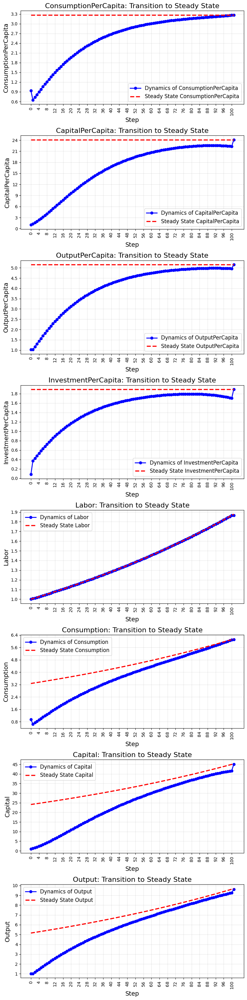

In [14]:
variables_dynamics_plots(raw_data, steady_state)

## Ramsey CARA

In [15]:
raw_data = pd.read_csv("../data/raw/Ramsey_cara_config_0_raw.csv")
raw_data.head()

,ConsumptionPerCapita,CapitalPerCapita,OutputPerCapita,InvestmentPerCapita,Labor,Consumption,Capital,Output
0,1.087499,1.313993,1.196082,0.108582,1.000000,1.087499,1.313993,1.196082
1,0.557129,1.844363,1.196082,0.638952,1.012242,0.563950,1.866943,1.210724
2,0.801069,2.384759,1.493874,0.692805,1.024634,0.820803,2.443506,1.530674
3,1.023544,2.932173,1.768023,0.744479,1.037178,1.061598,3.041186,1.833755
4,1.229634,3.484810,2.024572,0.794938,1.049876,1.290963,3.658617,2.125549


In [16]:
with open("../data/raw/Ramsey_cara_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)
params

{'alpha': 0.655694,
 'beta': 0.98801,
 'delta': 0.071405,
 'sigma': 1.469362,
 'n': 0.012242,
 'k_ss': 275.275168,
 'c_ss': 17.039454,
 'y_ss': 39.786875,
 'i_ss': 22.747421,
 'start_capital': 1.313993,
 'start_labor': 1.0}

In [17]:
alpha = params['alpha']
beta = params['beta']
delta = params['delta']
sigma = params['sigma']
n = params['n']
start_labor = params['start_labor']

k_percap_ss = ((1/beta - (1 - delta) / (1 + n)) / alpha) ** (1/(alpha - 1))
y_percap_ss = k_percap_ss ** alpha
i_percap_ss = (delta + n) * k_percap_ss 
c_percap_ss = y_percap_ss - i_percap_ss 

k_percap_ss_array = k_percap_ss * np.ones(raw_data.shape[0])
y_percap_ss_array = y_percap_ss * np.ones(raw_data.shape[0])
i_percap_ss_array = i_percap_ss * np.ones(raw_data.shape[0])
c_percap_ss_array = c_percap_ss * np.ones(raw_data.shape[0])

steps = np.arange(raw_data.shape[0])
labor_ss_array = start_labor * (1 + n) ** steps
capital_ss_array = k_percap_ss_array * labor_ss_array
output_ss_array = y_percap_ss_array * labor_ss_array
investment_ss_array = i_percap_ss_array * labor_ss_array
consumption_ss_array = c_percap_ss_array * labor_ss_array

steady_state = {
    "ConsumptionPerCapita": c_percap_ss_array,
    "CapitalPerCapita": k_percap_ss_array,
    "OutputPerCapita": y_percap_ss_array,
    "InvestmentPerCapita": i_percap_ss_array,
    "Labor": labor_ss_array,
    "Consumption": consumption_ss_array,
    "Capital": capital_ss_array,
    "Output": output_ss_array,
}

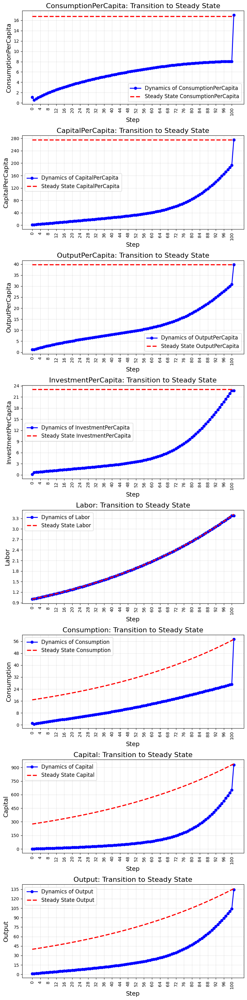

In [18]:
variables_dynamics_plots(raw_data, steady_state)

## Ramsey upgrade

In [19]:
raw_data = pd.read_csv("../data/raw/Ramsey_upgrade_config_0_raw.csv")
raw_data.head()

,ConsumptionPerCapita,CapitalPerCapita,OutputPerCapita,InvestmentPerCapita,ConsumptionPerEffectiveLabor,CapitalPerEffectiveLabor,OutputPerEffectiveLabor,InvestmentPerEffectiveLabor,Labor,Technology,InterestRate,GrossReturn,MarginalProductCapital,WagePerEffectiveLabor,Consumption,Capital,Output
0,1.231833,2.392739,1.468045,0.236212,1.231833,2.392739,1.468045,0.236212,1.000000,1.000000,0.195047,1.195047,0.269999,0.822007,1.231833,2.392739,1.468045
1,0.646921,3.049192,1.502795,0.855875,0.631961,2.978684,1.468045,0.836084,1.000095,1.023671,0.195047,1.195047,0.269999,0.822007,0.646982,3.049481,1.502938
2,0.770687,3.722295,1.694039,0.923351,0.735457,3.552139,1.616600,0.881143,1.000190,1.047902,0.163882,1.163882,0.238834,0.905188,0.770834,3.723001,1.694360
3,0.892885,4.401158,1.873845,0.980960,0.832366,4.102852,1.746837,0.914471,1.000285,1.072707,0.141460,1.141460,0.216412,0.978112,0.893140,4.402411,1.874378
4,1.012732,5.078034,2.043810,1.031077,0.922259,4.624386,1.861225,0.938966,1.000379,1.098099,0.124680,1.124680,0.199633,1.042161,1.013117,5.079961,2.044585


In [20]:
with open("../data/raw/Ramsey_upgrade_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)
params

{'alpha': 0.440067,
 'beta': 0.970805,
 'delta': 0.074952,
 'sigma': 0.697655,
 'n': 9.5e-05,
 'g': 0.023671,
 'k_tilde_ss': 9.889998,
 'c_tilde_ss': 1.764932,
 'y_tilde_ss': 2.741278,
 'i_tilde_ss': 0.976346,
 'r_ss': 0.047024,
 'start_capital': 2.392739,
 'start_labor': 1.0,
 'start_technology': 1.0}

In [21]:
alpha = params['alpha']
beta = params['beta']
delta = params['delta']
sigma = params['sigma']
n = params['n']
g = params['g']
start_labor = params['start_labor']
start_technology = params['start_technology']

r_ss = (1 + g) ** sigma / beta - 1
k_per_effcap_ss = (alpha / (r_ss + delta)) ** (1/(1 - alpha))
y_per_effcap_ss = k_per_effcap_ss ** alpha
i_per_effcap_ss = (delta + n + g + n*g) * k_per_effcap_ss 
c_per_effcap_ss = y_per_effcap_ss - i_per_effcap_ss 

k_per_effcap_ss_array = k_per_effcap_ss * np.ones(raw_data.shape[0])
y_per_effcap_ss_array = y_per_effcap_ss * np.ones(raw_data.shape[0])
i_per_effcap_ss_array = i_per_effcap_ss * np.ones(raw_data.shape[0])
c_per_effcap_ss_array = c_per_effcap_ss * np.ones(raw_data.shape[0])

steps = np.arange(raw_data.shape[0])
labor_ss_array = start_labor * (1 + n) ** steps
tech_ss_array = start_technology * (1 + g) ** steps

marginal_product_capital_ss_array = alpha * k_per_effcap_ss_array ** (alpha - 1)
interest_rate_ss_array = marginal_product_capital_ss_array - delta
gross_return_ss_array = 1 + interest_rate_ss_array
wage_per_effcap_ss_array = (1 - alpha) * y_per_effcap_ss_array

capital_percap_ss_array = k_per_effcap_ss_array * tech_ss_array
output_percap_ss_array = y_per_effcap_ss_array * tech_ss_array
investment_percap_ss_array = i_per_effcap_ss_array * tech_ss_array
consumption_percap_ss_array = c_per_effcap_ss_array * tech_ss_array

capital_ss_array = capital_percap_ss_array * labor_ss_array
output_ss_array = output_percap_ss_array * labor_ss_array
consumption_ss_array = consumption_percap_ss_array * labor_ss_array

steady_state = {
    'ConsumptionPerEffectiveLabor': c_per_effcap_ss_array,
    'CapitalPerEffectiveLabor': k_per_effcap_ss_array,
    'OutputPerEffectiveLabor': y_per_effcap_ss_array,
    'InvestmentPerEffectiveLabor': i_per_effcap_ss_array,
    'ConsumptionPerCapita': consumption_percap_ss_array,
    'CapitalPerCapita': capital_percap_ss_array,
    'OutputPerCapita': output_percap_ss_array,
    'InvestmentPerCapita': investment_percap_ss_array,
    'MarginalProductCapital': marginal_product_capital_ss_array,
    'InterestRate': interest_rate_ss_array,
    'GrossReturn': gross_return_ss_array,
    'WagePerEffectiveLabor': wage_per_effcap_ss_array,
    'Labor': labor_ss_array,
    'Technology': tech_ss_array,
    'Consumption': consumption_ss_array,
    'Capital': capital_ss_array,
    'Output': output_ss_array,
}

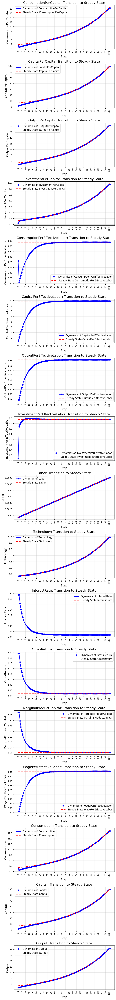

In [22]:
variables_dynamics_plots(raw_data, steady_state)

## OLG

In [23]:
raw_data = pd.read_csv("../data/raw/OLG_config_0_raw.csv")
raw_data.head()

,ConsYoung,ConsOld,Savings,Capital,Output,Wage,InterestRate
0,0.413506,0.104677,0.200653,0.898754,0.962129,0.614159,-0.478320
1,0.413506,0.104677,0.200653,0.151261,0.962129,0.614159,-0.478320
2,0.217061,0.269295,0.105329,0.079401,0.505050,0.322390,0.342091
3,0.171930,0.206093,0.083429,0.062892,0.400040,0.255359,0.956665
4,0.158030,0.187631,0.076684,0.057808,0.367699,0.234714,1.248992


In [24]:
with open("../data/raw/OLG_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)
params

{'alpha': 0.361667,
 'beta': 0.485249,
 'delta': 0.86549,
 'n': 0.077081,
 'g': 0.231602,
 'start_capital': 0.898754,
 'k_ss': 0.055111,
 'y_ss': 0.350549,
 'w_ss': 0.223767,
 'r_ss': 1.434975,
 's_ss': 0.073107,
 'c1_ss': 0.150659,
 'c2_ss': 0.178015}

In [25]:
alpha = params['alpha']
beta = params['beta']
delta = params['delta']
n = params['n']
g = params['g']

k_ss = ((beta * (1 - alpha)) / ((1 + beta) * (1 + n) * (1 + g))) ** (1 / (1 - alpha))
y_ss = k_ss ** alpha
w_ss = (1 - alpha) * y_ss
r_ss = alpha * k_ss ** (alpha - 1) - delta
s_ss = beta / (1 + beta) * w_ss
c1_ss = w_ss - s_ss
c2_ss = (1 + r_ss) * s_ss

c1_ss_array = c1_ss * np.ones(raw_data.shape[0])
c2_ss_array = c2_ss * np.ones(raw_data.shape[0])
s_ss_array = s_ss * np.ones(raw_data.shape[0])
k_ss_array = k_ss * np.ones(raw_data.shape[0])
y_ss_array = y_ss * np.ones(raw_data.shape[0])
w_ss_array = w_ss * np.ones(raw_data.shape[0])
r_ss_array = r_ss * np.ones(raw_data.shape[0])

steady_state = {
    'ConsYoung': c1_ss_array,
    'ConsOld': c2_ss_array,
    'Savings': s_ss_array,
    'Capital': k_ss_array,
    'Output': y_ss_array,
    'Wage': w_ss_array,
    'InterestRate': r_ss_array,
}

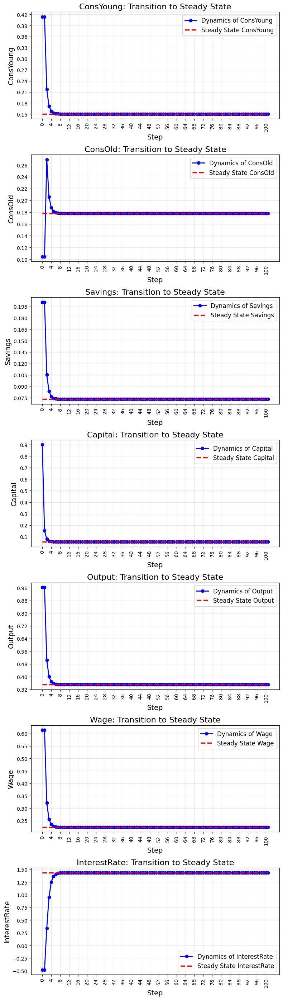

In [26]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_baseline_perfect_foresight

In [24]:
raw_data = pd.read_csv("../data/raw/RBC_baseline_pf_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Investment,InterestRate,LoggedProductivity,Productivity
0,0.819448,0.624075,0.846093,0.026645,0.437877,0.0,1.0
1,0.514465,0.929059,0.846093,0.331628,0.437877,0.0,1.0
2,0.613929,1.249718,0.974254,0.360325,0.329017,0.0,1.0
3,0.701551,1.577034,1.082223,0.380672,0.264265,0.0,1.0
4,0.779936,1.905012,1.175245,0.395309,0.221463,0.0,1.0


In [25]:
with open("../data/raw/RBC_baseline_pf_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'alpha': 0.354468,
 'beta': 0.958799,
 'delta': 0.042695,
 'rho': 0.785634,
 'sigma': 1.816646,
 'start_capital': 0.624075,
 'k_ss': 9.02492,
 'c_ss': 1.795775,
 'y_ss': 2.181092,
 'r_ss': 0.042971}

In [26]:
beta = params["beta"]
alpha = params["alpha"]
delta = params["delta"]
rho = params["rho"]

k_ss = ((1 / beta - (1 - delta)) / alpha) ** (1 / (alpha - 1))
y_ss = k_ss ** alpha
i_ss = delta * k_ss
c_ss = y_ss - i_ss
r_ss = 1 / beta - 1
logged_productivity_ss = 0
productivity_ss = np.exp(logged_productivity_ss)

steps = np.arange(raw_data.shape[0])

k_ss = k_ss * np.ones(raw_data.shape[0])
y_ss = y_ss * np.ones(raw_data.shape[0])
i_ss = i_ss * np.ones(raw_data.shape[0])
c_ss = c_ss * np.ones(raw_data.shape[0])
r_ss = r_ss * np.ones(raw_data.shape[0])
logged_productivity_ss = logged_productivity_ss * np.ones(raw_data.shape[0])
productivity_ss = productivity_ss * np.ones(raw_data.shape[0])

steady_state = {
    'Capital': k_ss,
    'Output': y_ss,
    'Investment': i_ss,
    'Consumption': c_ss,
    'InterestRate': r_ss,
    'LoggedProductivity': logged_productivity_ss,
    'Productivity': productivity_ss
}

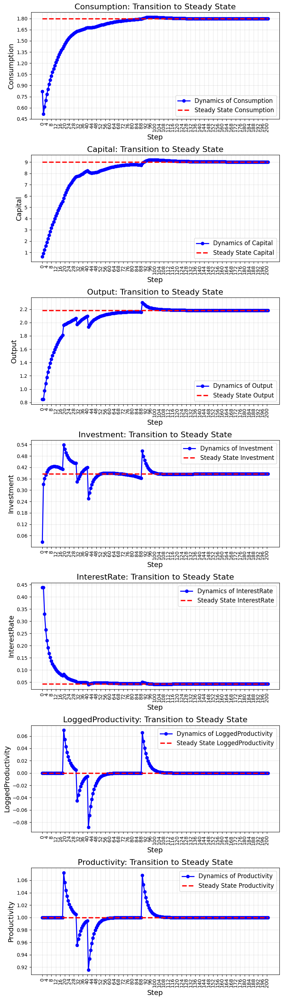

In [27]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_baseline_stoch

In [33]:
raw_data = pd.read_csv("../data/raw/RBC_baseline_stoch_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Investment,Productivity,LoggedProductivity,InterestRate
0,4.564143,50.183170,6.091616,1.527473,0.987835,-0.012165,0.024792
1,4.568783,50.173355,6.148868,1.580085,0.997715,-0.002285,0.025255
2,4.564949,50.144118,6.125300,1.560352,0.993984,-0.006016,0.025100
3,4.568497,50.148493,6.161535,1.593038,1.000130,0.000130,0.025381
4,4.573717,50.182976,6.197000,1.623284,1.005840,0.005840,0.025625


In [34]:
with open("../data/raw/RBC_baseline_stoch_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'alpha': 0.464429,
 'beta': 0.97531,
 'delta': 0.031682,
 'rho': 0.811485,
 'sigma': 1.204223,
 'k_ss': 50.247639,
 'c_ss': 4.574693,
 'y_ss': 6.166635,
 'r_ss': 0.025315}

In [35]:
beta = params["beta"]
alpha = params["alpha"]
delta = params["delta"]
rho = params["rho"]

k_ss = ((1 / beta - (1 - delta)) / alpha) ** (1 / (alpha - 1))
y_ss = k_ss ** alpha
i_ss = delta * k_ss
c_ss = y_ss - i_ss
r_ss = 1 / beta - 1
logged_productivity_ss = 0
productivity_ss = np.exp(logged_productivity_ss)

steps = np.arange(raw_data.shape[0])

k_ss = k_ss * np.ones(raw_data.shape[0])
y_ss = y_ss * np.ones(raw_data.shape[0])
i_ss = i_ss * np.ones(raw_data.shape[0])
c_ss = c_ss * np.ones(raw_data.shape[0])
r_ss = r_ss * np.ones(raw_data.shape[0])
logged_productivity_ss = logged_productivity_ss * np.ones(raw_data.shape[0])
productivity_ss = productivity_ss * np.ones(raw_data.shape[0])

steady_state = {
    'Capital': k_ss,
    'Output': y_ss,
    'Investment': i_ss,
    'Consumption': c_ss,
    'InterestRate': r_ss,
    'LoggedProductivity': logged_productivity_ss,
    'Productivity': productivity_ss
}

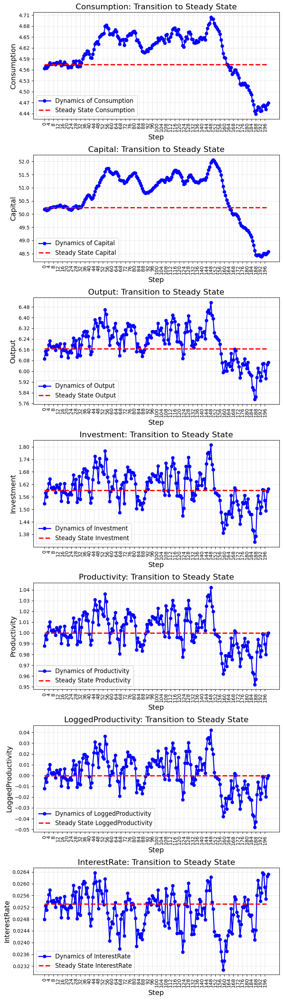

In [36]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_capital_stock_shock_perfect_foresight

In [45]:
raw_data = pd.read_csv("../data/raw/RBC_capital_stock_shock_pf_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Investment,Labor,MarginalProductCapital,InterestRate,Wage,LoggedProductivity,Productivity
0,0.640289,2.133669,0.695718,0.055429,0.398961,0.108138,0.082160,1.165494,0.0,1.0
1,0.505328,2.413900,0.840988,0.335660,0.529850,0.130718,0.104740,1.060825,0.0,1.0
2,0.530540,2.685212,0.864560,0.334020,0.519425,0.118782,0.092804,1.112448,0.0,1.0
3,0.553610,2.946643,0.884798,0.331188,0.510039,0.109280,0.083302,1.159438,0.0,1.0
4,0.574792,3.197608,0.902305,0.327513,0.501549,0.101555,0.075577,1.202394,0.0,1.0


In [46]:
with open("../data/raw/RBC_capital_stock_shock_pf_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'alpha': 0.331645,
 'beta': 0.980886,
 'delta': 0.025978,
 'rho': 0.857985,
 'sigma': 1.42639,
 'psi': 1.320384,
 'start_capital': 2.133669,
 'k_ss': 7.801313,
 'y_ss': 1.069456,
 'c_ss': 0.866793,
 'i_ss': 0.202664,
 'l_ss': 0.398961,
 'r_ss': 0.019486,
 'w_ss': 1.791596}

In [47]:
beta = params["beta"]
alpha = params["alpha"]
delta = params["delta"]
rho = params["rho"]
l_ss = params["l_ss"]

r_ss = 1 / beta - 1
k_ss = ((r_ss + delta) / alpha) ** (1 / (alpha - 1)) * l_ss
y_ss = k_ss ** alpha * l_ss ** (1 - alpha)
i_ss = delta * k_ss
c_ss = y_ss - i_ss
w_ss = (1 - alpha) * y_ss / l_ss
mpk_ss = alpha * k_ss ** (alpha-1) * l_ss ** (1-alpha)
logged_productivity_ss = 0
productivity_ss = np.exp(logged_productivity_ss)

steps = np.arange(raw_data.shape[0])

k_ss = k_ss * np.ones(raw_data.shape[0])
y_ss = y_ss * np.ones(raw_data.shape[0])
i_ss = i_ss * np.ones(raw_data.shape[0])
c_ss = c_ss * np.ones(raw_data.shape[0])
r_ss = r_ss * np.ones(raw_data.shape[0])
w_ss = w_ss * np.ones(raw_data.shape[0])
l_ss = l_ss * np.ones(raw_data.shape[0])
mpk_ss = mpk_ss * np.ones(raw_data.shape[0])
logged_productivity_ss = logged_productivity_ss * np.ones(raw_data.shape[0])
productivity_ss = productivity_ss * np.ones(raw_data.shape[0])

steady_state = {
    'Capital': k_ss,
    'Output': y_ss,
    'Investment': i_ss,
    'Consumption': c_ss,
    'InterestRate': r_ss,
    'Wage': w_ss,
    'Labor': l_ss,
    'MarginalProductCapital': mpk_ss,
    'LoggedProductivity': logged_productivity_ss,
    'Productivity': productivity_ss
}

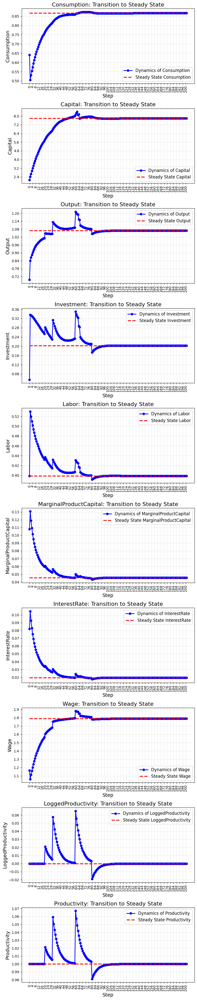

In [48]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_capital_shock_stock_stoch

In [74]:
raw_data = pd.read_csv("../data/raw/RBC_capital_stock_shock_stoch_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Investment,Labor,MarginalProductCapital,InterestRate,Wage,LoggedProductivity,Productivity
0,0.575660,5.311211,0.709161,0.133501,0.291437,0.041826,0.010272,1.661516,-0.036290,0.963710
1,0.572654,5.249165,0.704526,0.131872,0.291736,0.042180,0.010626,1.649283,-0.038634,0.961366
2,0.573046,5.220863,0.738600,0.165554,0.301054,0.044700,0.013146,1.673714,-0.010805,0.989195
3,0.571393,5.204672,0.717724,0.146331,0.296094,0.043702,0.012148,1.654485,-0.025646,0.974354
4,0.572166,5.204795,0.733079,0.160914,0.299978,0.044741,0.013187,1.667292,-0.013081,0.986919


In [75]:
with open("../data/raw/RBC_capital_stock_shock_stoch_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'alpha': 0.317753,
 'beta': 0.987398,
 'delta': 0.031554,
 'rho': 0.722491,
 'sigma': 1.467873,
 'psi': 2.649065,
 'k_ss': 5.387563,
 'y_ss': 0.751397,
 'c_ss': 0.581398,
 'i_ss': 0.169999,
 'l_ss': 0.300202,
 'r_ss': 0.012763,
 'w_ss': 1.707643}

In [76]:
beta = params["beta"]
alpha = params["alpha"]
delta = params["delta"]
rho = params["rho"]
l_ss = params["l_ss"]

r_ss = 1 / beta - 1
k_ss = ((r_ss + delta) / alpha) ** (1 / (alpha - 1)) * l_ss
y_ss = k_ss ** alpha * l_ss ** (1 - alpha)
i_ss = delta * k_ss
c_ss = y_ss - i_ss
w_ss = (1 - alpha) * y_ss / l_ss
mpk_ss = alpha * k_ss ** (alpha-1) * l_ss ** (1-alpha)
logged_productivity_ss = 0
productivity_ss = np.exp(logged_productivity_ss)

steps = np.arange(raw_data.shape[0])

k_ss = k_ss * np.ones(raw_data.shape[0])
y_ss = y_ss * np.ones(raw_data.shape[0])
i_ss = i_ss * np.ones(raw_data.shape[0])
c_ss = c_ss * np.ones(raw_data.shape[0])
r_ss = r_ss * np.ones(raw_data.shape[0])
w_ss = w_ss * np.ones(raw_data.shape[0])
l_ss = l_ss * np.ones(raw_data.shape[0])
mpk_ss = mpk_ss * np.ones(raw_data.shape[0])
logged_productivity_ss = logged_productivity_ss * np.ones(raw_data.shape[0])
productivity_ss = productivity_ss * np.ones(raw_data.shape[0])

steady_state = {
    'Capital': k_ss,
    'Output': y_ss,
    'Investment': i_ss,
    'Consumption': c_ss,
    'InterestRate': r_ss,
    'Wage': w_ss,
    'Labor': l_ss,
    'MarginalProductCapital': mpk_ss,
    'LoggedProductivity': logged_productivity_ss,
    'Productivity': productivity_ss
}

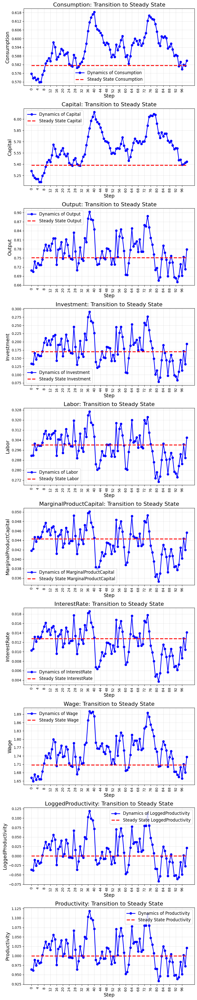

In [77]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_news_shock_model_perfect_foresight

In [16]:

raw_data = pd.read_csv("../data/raw/RBC_news_shock_model_pf_config_0_raw.csv")
raw_data = raw_data[[col for col in raw_data.columns if 'AUX' not in col]]
raw_data.head()

,Output,Consumption,Capital,Labor,LoggedProductivity,AnnualInterestRate,Wage,Investment
0,-0.126119,-0.396864,2.099750,-1.172495,0.0,0.138108,0.661047,-1.565018
1,-0.127464,-0.396060,2.099540,-1.174472,0.0,0.137923,0.661679,-1.573305
2,-0.127554,-0.396082,2.099328,-1.174505,0.0,0.137939,0.661623,-1.573614
3,-0.127648,-0.396102,2.099113,-1.174545,0.0,0.137955,0.661568,-1.573952
4,-0.127748,-0.396119,2.098894,-1.174591,0.0,0.137971,0.661514,-1.574318


In [17]:
with open("../data/raw/RBC_news_shock_model_pf_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'alpha': 0.319773,
 'beta': 0.99124,
 'delta': 0.0166,
 'sigma': 1.886101,
 'rhoz': 0.931294,
 'psi': 2.826667,
 'gammax': 1.009011,
 'n': 0.0029,
 'x': 0.006093,
 'i_y': 0.237189,
 'k_y': 9.26153,
 'l_ss': 0.309593,
 'k_ss': 8.164128,
 'y_ss': 0.88151,
 'c_ss': 0.672425,
 'i_ss': 0.209084,
 'w_ss': 1.936819,
 'r_ss': 0.138108}

In [18]:
alpha = params["alpha"]
sigma = params["sigma"]
rhoz = params["rhoz"]
n = params["n"]
x = params["x"]
i_y = params["i_y"]
k_y = params["k_y"]
l_ss_target = params["l_ss"]

gammax = (1 + n) * (1 + x)
delta = i_y / k_y - x - n - n * x
beta = gammax / (alpha / k_y + (1 - delta))

# Steady state расчёты
l_ss = l_ss_target
k_ss = ((1 / beta * gammax - (1 - delta)) / alpha) ** (1 / (alpha - 1)) * l_ss
y_ss = k_ss ** alpha * l_ss ** (1 - alpha)
i_ss = (x + n + delta + n * x) * k_ss
c_ss = y_ss - i_ss
w_ss = (1 - alpha) * y_ss / l_ss
r_ss = 4 * alpha * y_ss / k_ss
psi = (1 - alpha) * (k_ss / l_ss) ** alpha * (1 - l_ss) / c_ss ** sigma

logged_productivity_ss = 0

log_k_ss = np.log(k_ss)
log_y_ss = np.log(y_ss)
log_c_ss = np.log(c_ss)
log_i_ss = np.log(i_ss)
log_w_ss = np.log(w_ss)
log_l_ss = np.log(l_ss)

n_periods = raw_data.shape[0]

steady_state = {
    'Capital': np.full(n_periods, log_k_ss),
    'Output': np.full(n_periods, log_y_ss),
    'Investment': np.full(n_periods, log_i_ss),
    'Consumption': np.full(n_periods, log_c_ss),
    'AnnualInterestRate': np.full(n_periods, r_ss),
    'Wage': np.full(n_periods, log_w_ss),
    'Labor': np.full(n_periods, log_l_ss),
    'LoggedProductivity': np.full(n_periods, logged_productivity_ss),
}

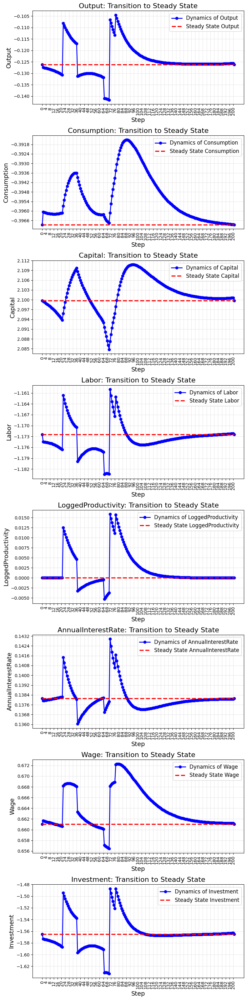

In [19]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_news_shock_model_stoch

In [20]:
raw_data = pd.read_csv("../data/raw/RBC_news_shock_model_stoch_config_0_raw.csv")
raw_data = raw_data[[col for col in raw_data.columns if 'AUX' not in col]]
raw_data.head()

,Output,Consumption,Capital,Labor,LoggedProductivity,AnnualInterestRate,Wage,Investment
0,-0.095216,-0.321803,2.054884,-1.064997,0.013317,0.143131,0.603428,-1.688793
1,-0.083311,-0.317358,2.057533,-1.060948,0.021881,0.144558,0.611285,-1.645318
2,-0.072854,-0.310291,2.060663,-1.060087,0.030928,0.145655,0.620880,-1.620519
3,-0.072653,-0.311024,2.063816,-1.059330,0.029644,0.145243,0.620324,-1.616364
4,-0.074562,-0.310455,2.066631,-1.061071,0.027975,0.144533,0.620156,-1.628758


In [21]:
with open("../data/raw/RBC_news_shock_model_stoch_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'alpha': 0.306742,
 'beta': 0.987046,
 'delta': 0.013854,
 'sigma': 1.294572,
 'rhoz': 0.98244,
 'psi': 1.817292,
 'gammax': 1.008024,
 'n': 0.003457,
 'x': 0.004551,
 'i_y': 0.191156,
 'k_y': 8.737405,
 'l_ss': 0.341788,
 'k_ss': 7.792329,
 'y_ss': 0.891836,
 'c_ss': 0.721356,
 'i_ss': 0.17048,
 'w_ss': 1.808936,
 'r_ss': 0.140427}

In [22]:
alpha = params["alpha"]
sigma = params["sigma"]
rhoz = params["rhoz"]
n = params["n"]
x = params["x"]
i_y = params["i_y"]
k_y = params["k_y"]
l_ss_target = params["l_ss"]

gammax = (1 + n) * (1 + x)
delta = i_y / k_y - x - n - n * x
beta = gammax / (alpha / k_y + (1 - delta))

# Steady state расчёты
l_ss = l_ss_target
k_ss = ((1 / beta * gammax - (1 - delta)) / alpha) ** (1 / (alpha - 1)) * l_ss
y_ss = k_ss ** alpha * l_ss ** (1 - alpha)
i_ss = (x + n + delta + n * x) * k_ss
c_ss = y_ss - i_ss
w_ss = (1 - alpha) * y_ss / l_ss
r_ss = 4 * alpha * y_ss / k_ss
psi = (1 - alpha) * (k_ss / l_ss) ** alpha * (1 - l_ss) / c_ss ** sigma

logged_productivity_ss = 0

log_k_ss = np.log(k_ss)
log_y_ss = np.log(y_ss)
log_c_ss = np.log(c_ss)
log_i_ss = np.log(i_ss)
log_w_ss = np.log(w_ss)
log_l_ss = np.log(l_ss)

n_periods = raw_data.shape[0]

steady_state = {
    'Capital': np.full(n_periods, log_k_ss),
    'Output': np.full(n_periods, log_y_ss),
    'Investment': np.full(n_periods, log_i_ss),
    'Consumption': np.full(n_periods, log_c_ss),
    'AnnualInterestRate': np.full(n_periods, r_ss),
    'Wage': np.full(n_periods, log_w_ss),
    'Labor': np.full(n_periods, log_l_ss),
    'LoggedProductivity': np.full(n_periods, logged_productivity_ss),
}

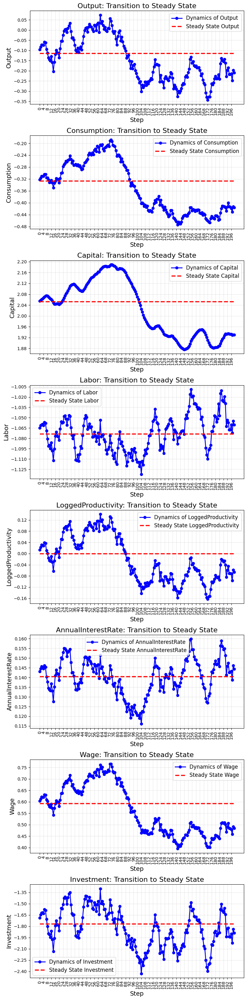

In [23]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_state_dependent_GIRF_household

In [47]:
raw_data = pd.read_csv("../data/raw/RBC_state_dependent_GIRF_household_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Labor,LoggedProductivity,LoggedGovSpending,InterestRate,Wage,Investment,GovSpending
0,0.772188,11.129086,1.208806,0.327208,-0.009331,0.006684,0.161840,2.316253,0.250136,0.186482
1,0.770599,11.111728,1.206698,0.327105,-0.010303,0.010856,0.161801,2.312972,0.248844,0.187255
2,0.770508,11.107257,1.220021,0.329523,-0.003453,0.015192,0.163840,2.321213,0.261455,0.188058
3,0.769582,11.096427,1.212390,0.328309,-0.007219,0.014265,0.162884,2.315287,0.254921,0.187886
4,0.769676,11.091664,1.218152,0.329331,-0.004101,0.013166,0.163815,2.319016,0.260793,0.187683


In [48]:
with open("../data/raw/RBC_state_dependent_GIRF_household_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

In [49]:
alpha = params["alpha"]
sigma = params["sigma"]
n = params["n"]
x = params["x"]
i_y = params["i_y"]
k_y = params["k_y"]
gshare = params['gshare']
l_ss_target = params["l_ss"]

gammax = (1 + n) * (1 + x)
delta = i_y / k_y - x - n - n * x
beta = gammax / (alpha / k_y + (1 - delta))

l_ss = 0.33

l_ss = l_ss_target
k_ss = ((1 / beta * gammax - (1 - delta)) / alpha) ** (1 / (alpha - 1)) * l_ss
y_ss = k_ss ** alpha * l_ss ** (1 - alpha)
i_ss = (x + n + delta + n * x) * k_ss
g_ss = gshare * y_ss
c_ss = y_ss - i_ss - g_ss
w_ss = (1 - alpha) * y_ss / l_ss
r_ss = 4 * alpha * y_ss / k_ss
psi = (1 - alpha) * (k_ss / l_ss) ** alpha * (1 - l_ss) / c_ss ** sigma

logged_productivity_ss = 0
logged_gov_spending_ss = 0

n_periods = raw_data.shape[0]

steady_state = {
    'Consumption': np.full(n_periods, c_ss),
    'Capital': np.full(n_periods, k_ss),
    'Output': np.full(n_periods, y_ss),
    'Labor': np.full(n_periods, l_ss),
    'LoggedProductivity': np.full(n_periods, logged_productivity_ss),
    'LoggedGovSpending': np.full(n_periods, logged_gov_spending_ss),
    'InterestRate': np.full(n_periods, r_ss),
    'Wage': np.full(n_periods, w_ss),
    'Investment': np.full(n_periods, i_ss),
    'GovSpending': np.full(n_periods, g_ss),
}

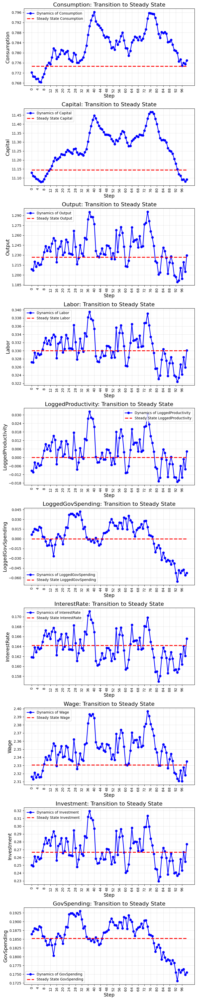

In [50]:
variables_dynamics_plots(raw_data, steady_state)

## RBC_state_dependent_GIRF_government

In [51]:
raw_data = pd.read_csv("../data/raw/RBC_state_dependent_GIRF_government_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Labor,LoggedProductivity,LoggedGovSpending,InterestRate,Wage,Investment,GovSpending
0,0.772012,16.258530,1.421533,0.327826,-0.010475,0.010010,0.132146,2.695737,0.268050,0.381471
1,0.770568,16.233876,1.419244,0.328026,-0.011929,0.016088,0.132113,2.689777,0.264909,0.383767
2,0.770522,16.224129,1.436111,0.330629,-0.004567,0.022318,0.133885,2.700119,0.279470,0.386120
3,0.769711,16.206523,1.426557,0.329474,-0.008788,0.020569,0.133077,2.691630,0.271387,0.385459
4,0.769983,16.196461,1.433366,0.330414,-0.005429,0.018607,0.133855,2.696717,0.278665,0.384718


In [52]:
with open("../data/raw/RBC_state_dependent_GIRF_government_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

In [53]:
alpha = params["alpha"]
sigma = params["sigma"]
n = params["n"]
x = params["x"]
i_y = params["i_y"]
k_y = params["k_y"]
gshare = params['gshare']
l_ss_target = params["l_ss"]

gammax = (1 + n) * (1 + x)
delta = i_y / k_y - x - n - n * x
beta = gammax / (alpha / k_y + (1 - delta))

l_ss = 0.33

l_ss = l_ss_target
k_ss = ((1 / beta * gammax - (1 - delta)) / alpha) ** (1 / (alpha - 1)) * l_ss
y_ss = k_ss ** alpha * l_ss ** (1 - alpha)
i_ss = (x + n + delta + n * x) * k_ss
g_ss = gshare * y_ss
c_ss = y_ss - i_ss - g_ss
w_ss = (1 - alpha) * y_ss / l_ss
r_ss = 4 * alpha * y_ss / k_ss
psi = (1 - alpha) * (k_ss / l_ss) ** alpha * (1 - l_ss) / c_ss ** sigma

logged_productivity_ss = 0
logged_gov_spending_ss = 0

n_periods = raw_data.shape[0]

steady_state = {
    'Consumption': np.full(n_periods, c_ss),
    'Capital': np.full(n_periods, k_ss),
    'Output': np.full(n_periods, y_ss),
    'Labor': np.full(n_periods, l_ss),
    'LoggedProductivity': np.full(n_periods, logged_productivity_ss),
    'LoggedGovSpending': np.full(n_periods, logged_gov_spending_ss),
    'InterestRate': np.full(n_periods, r_ss),
    'Wage': np.full(n_periods, w_ss),
    'Investment': np.full(n_periods, i_ss),
    'GovSpending': np.full(n_periods, g_ss),
}

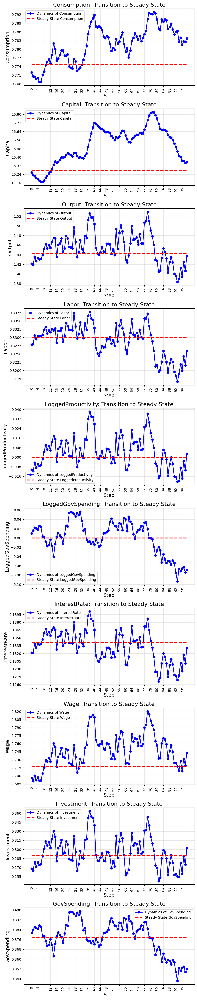

In [54]:
variables_dynamics_plots(raw_data, steady_state)

## Aguiar_Gopinath_2007

In [24]:
raw_data = pd.read_csv("../data/raw/Aguiar_Gopinath_2007_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Output,Debt,BondPrice,GovSpending,Labor,Utility,Productivity,MUConsumption,MULabor,ConsumptionGdp,InvestmentGDP,NetExports,Investment,LogOutput,LogConsumption,LogInvestment,OutputGrowth
0,22.521736,404.770316,34.847686,5.090552,0.967849,0.024715,0.247738,-0.558653,-0.006211,0.007620,-0.357314,0.646250,0.364152,-0.010402,12.690403,3.550995,3.114548,2.540866,0.002488
1,22.332233,394.237932,34.459565,5.611975,0.967116,0.032702,0.247253,-0.559947,-0.007360,0.007703,-0.357912,0.647891,0.366149,-0.014040,12.620396,3.539903,3.106036,2.535315,0.013623
2,22.048924,381.125357,34.114043,6.204667,0.966283,0.039793,0.247789,-0.562336,-0.003276,0.007835,-0.359704,0.646077,0.370352,-0.016429,12.642942,3.530028,3.093310,2.537102,0.022828
3,21.318873,371.413876,33.259082,6.539976,0.965812,0.031470,0.249359,-0.568562,-0.005814,0.008175,-0.364458,0.640759,0.366842,-0.007602,12.212029,3.505595,3.060518,2.502930,0.015359
4,20.807571,364.705806,32.770587,6.692371,0.965597,0.024424,0.251051,-0.573136,-0.003968,0.008416,-0.368209,0.635029,0.366241,-0.001271,12.014948,3.491634,3.037552,2.487302,0.017509


In [25]:
with open("../data/raw/Aguiar_Gopinath_2007_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'growth_rate': 0.006578,
 'sigma': 1.788408,
 'debt_share': 0.133689,
 'capital_share': 0.333362,
 'beta': 0.976794,
 'depreciation': 0.023995,
 'capital_adjustment_cost': 4.210382,
 'labor_share': 0.3897,
 'elasticity_substitution': 0.001499,
 'steady_state_debt': 4.677897,
 'interest_rate': 0.0326,
 'persistence_productivity': 0.842891,
 'persistence_gov_spending': 0.779782}

In [26]:
beta = params["beta"]
sigma = params["sigma"]
debt_share = params["debt_share"]
capital_share = params["capital_share"]
labor_share = params["labor_share"]
depreciation = params["depreciation"]
capital_adjustment_cost = params["capital_adjustment_cost"]
elasticity_substitution = params["elasticity_substitution"]
persistence_productivity = params["persistence_productivity"]
persistence_gov_spending = params["persistence_gov_spending"]
growth_rate = params["growth_rate"]
interest_rate = params["interest_rate"]

BondPrice_ss = beta * np.exp(growth_rate) ** (labor_share * (1 - sigma) - 1)
output_capital_ratio = ((1 / BondPrice_ss) - (1 - depreciation)) / (1 - capital_share)
ConsumptionGDP_ss = 1 + (1 - np.exp(growth_rate) - depreciation) * (1 / output_capital_ratio) - (1 - np.exp(growth_rate) * BondPrice_ss) * debt_share
Labor_ss = (capital_share * labor_share) / (ConsumptionGDP_ss - labor_share * ConsumptionGDP_ss + capital_share * labor_share)
Capital_ss = (((np.exp(growth_rate) ** capital_share) * (Labor_ss ** capital_share)) / output_capital_ratio) ** (1 / capital_share)
Output_ss = Capital_ss ** (1 - capital_share) * (Labor_ss * np.exp(growth_rate)) ** capital_share
Consumption_ss = ConsumptionGDP_ss * Output_ss
Investment_ss = (np.exp(growth_rate) - 1 + depreciation) * Capital_ss
Debt_ss = debt_share * Output_ss
NetExports_ss = (Output_ss - Consumption_ss - Investment_ss) / Output_ss
Productivity_ss = 0
GovSpending_ss = growth_rate
Utility_ss = (Consumption_ss ** labor_share * (1 - Labor_ss) ** (1 - labor_share)) ** (1 - sigma) / (1 - sigma)
MUConsumption_ss = labor_share * Utility_ss / Consumption_ss * (1 - sigma)
MULabor_ss = -(1 - labor_share) * Utility_ss / (1 - Labor_ss) * (1 - sigma)
InvestmentGDP_ss = Investment_ss / Output_ss
LogOutput_ss = np.log(Output_ss)
LogConsumption_ss = np.log(Consumption_ss)
LogInvestment_ss = np.log(Investment_ss)
OutputGrowth_ss = growth_rate

n_periods = raw_data.shape[0]

steady_state = {
    'Consumption': np.full(n_periods, Consumption_ss),
    'Capital': np.full(n_periods, Capital_ss),
    'Output': np.full(n_periods, Output_ss),
    'Debt': np.full(n_periods, Debt_ss),
    'BondPrice': np.full(n_periods, BondPrice_ss),
    'GovSpending': np.full(n_periods, GovSpending_ss),
    'Labor': np.full(n_periods, Labor_ss),
    'Utility': np.full(n_periods, Utility_ss),
    'Productivity': np.full(n_periods, Productivity_ss),
    'MUConsumption': np.full(n_periods, MUConsumption_ss),
    'MULabor': np.full(n_periods, MULabor_ss),
    'ConsumptionGdp': np.full(n_periods, ConsumptionGDP_ss),
    'InvestmentGDP': np.full(n_periods, InvestmentGDP_ss),
    'NetExports': np.full(n_periods, NetExports_ss),
    'Investment': np.full(n_periods, Investment_ss),
    'LogOutput': np.full(n_periods, LogOutput_ss),
    'LogConsumption': np.full(n_periods, LogConsumption_ss),
    'LogInvestment': np.full(n_periods, LogInvestment_ss),
    'OutputGrowth': np.full(n_periods, OutputGrowth_ss),
}

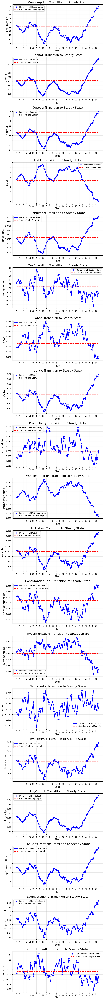

In [27]:
variables_dynamics_plots(raw_data, steady_state)

## Garcia_Cicco

In [77]:
raw_data = pd.read_csv("../data/raw/GarciaCicco_2010_config_0_raw.csv")
raw_data.head()

,Consumption,Capital,Labor,Output,Investment,Debt,TradeBalance,MUConsumption,TradeBalanceToOutput,OutputGrowth,ConsumptionGrowth,InvestmentGrowth,TechGrowthRate,InterestRate,LoggedProductivity,CountryPremiumShock,PreferenceShock
0,0.261218,0.551845,0.239984,0.314546,0.065203,0.020320,-0.011874,23.225489,-0.036592,0.973985,1.006497,1.036850,1.025591,1.085351,-0.032601,1,1
1,0.261375,0.539175,0.239195,0.312756,0.066828,0.038465,-0.015447,22.977863,-0.047607,1.020050,1.026198,1.051436,1.034794,1.085366,-0.035903,1,1
2,0.267993,0.526934,0.244265,0.324258,0.070337,0.056545,-0.014072,22.351670,-0.043422,1.070410,1.060293,1.090595,1.042802,1.085388,-0.011889,1,1
3,0.255314,0.518743,0.237811,0.309617,0.066945,0.074631,-0.012642,24.385450,-0.038936,0.997466,0.993949,0.988866,1.031983,1.085409,-0.025052,1,1
4,0.251317,0.515371,0.237850,0.309706,0.065884,0.088686,-0.007495,25.557277,-0.023053,1.032258,1.016581,1.015101,1.023128,1.085431,-0.014125,1,1


In [78]:
with open("../data/raw/GarciaCicco_2010_config_0_params.yaml", 'r') as f:
    params = yaml.safe_load(f)

params

{'beta': 0.926515,
 'gamma_c': 1.596019,
 'delta': 0.108761,
 'alpha': 0.336696,
 'psi': 0.001184,
 'omega': 1.709338,
 'theta': 2.393073,
 'phi': 3.801343,
 'd_ss': 0.007057,
 'g_ss': 1.003501,
 'rho_a': 0.7592,
 'rho_g': 0.755984,
 'rho_nu': 0.888315,
 'rho_mu': 0.885379,
 'k_ss': 0.562129,
 'c_ss': 0.26044,
 'y_ss': 0.324078,
 'h_ss': 0.244185,
 'i_ss': 0.063106,
 'r_ss': 1.085351,
 'tb_ss': 0.000532,
 'mu_c_ss': 24.526513}

In [79]:
alpha = params["alpha"]
beta = params["beta"]
gamma_c = params["gamma_c"]
delta = params["delta"]
psi = params["psi"]
omega = params["omega"]
theta = params["theta"]
phi = params["phi"]
d_ss = params["d_ss"]
g_ss = params["g_ss"]

theta = 1.4 * omega

r_ss = g_ss ** gamma_c / beta
k_gh_ratio = ((g_ss ** gamma_c / beta - 1 + delta) / alpha) ** (1 / (alpha - 1))
h_ss = ((1 - alpha) * g_ss * k_gh_ratio ** alpha / theta) ** (1 / (omega - 1))
k_ss = k_gh_ratio * g_ss * h_ss
i_ss = (g_ss - 1 + delta) * k_ss
y_ss = k_ss ** alpha * (h_ss * g_ss) ** (1 - alpha)
tb_ss = d_ss * (1 - g_ss / r_ss)
c_ss = y_ss - i_ss - tb_ss
mu_c_ss = (c_ss - theta / omega * h_ss ** omega) ** (-gamma_c)
tb_y_ss = tb_ss / y_ss

output_growth_ss = g_ss
consumption_growth_ss = g_ss
investment_growth_ss = g_ss
tech_growth_rate_ss = g_ss

logged_productivity_ss = 0
preference_shock_ss = 1
country_premium_shock_ss = 1


n_periods = raw_data.shape[0]

steady_state = {
    'Consumption': np.full(n_periods, c_ss),
    'Capital': np.full(n_periods, k_ss),
    'Labor': np.full(n_periods, h_ss),
    'Output': np.full(n_periods, y_ss),
    'Investment': np.full(n_periods, i_ss),
    'Debt': np.full(n_periods, d_ss),
    'TradeBalance': np.full(n_periods, tb_ss),
    'MUConsumption': np.full(n_periods, mu_c_ss),
    'TradeBalanceToOutput': np.full(n_periods, tb_y_ss),
    'OutputGrowth': np.full(n_periods, output_growth_ss),
    'ConsumptionGrowth': np.full(n_periods, consumption_growth_ss),
    'InvestmentGrowth': np.full(n_periods, investment_growth_ss),
    'TechGrowthRate': np.full(n_periods, tech_growth_rate_ss),
    'InterestRate': np.full(n_periods, r_ss),
    'LoggedProductivity': np.full(n_periods, logged_productivity_ss),
    'CountryPremiumShock': np.full(n_periods, country_premium_shock_ss),
    'PreferenceShock': np.full(n_periods, preference_shock_ss),
}

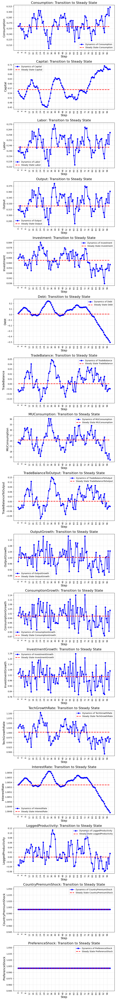

In [80]:
variables_dynamics_plots(raw_data, steady_state)